# Machine Learning with PyTorch and Scikit-Learn  
# -- Code Examples

## Package version checks

Add folder to path in order to load from the check_packages.py script:

In [1]:
import sys
sys.path.insert(0, '..')

Check recommended package versions:

In [2]:
from python_environment_check import check_packages


d = {
    'torch': '1.8.0',
    'networkx': '2.6.2',
    'numpy': '1.21.2',
}

check_packages(d)

[OK] Your Python version is 3.9.7 | packaged by conda-forge | (default, Sep 29 2021, 19:24:02) 
[Clang 11.1.0 ]
[OK] torch 1.12.0
[OK] networkx 2.8.6
[OK] numpy 1.23.1


# Chapter 18 - Graph Neural Networks for Capturing Dependencies in Graph Structured Data (Part 1/2)

- [Introduction to graph data](#Introduction-to-graph-data)
  - [Undirected graphs](#Undirected-graphs)
  - [Directed graphs](#Directed-graphs)
  - [Labeled graphs](#Labeled-graphs)
  - [Representing molecules as graphs](#Representing-molecules-as-graphs)
- [Understanding graph convolutions](#Understanding-graph-convolutions)
  - [The motivation behind using graph convolutions](#The-motivation-behind-using-graph-convolutions)
  - [Implementing a basic graph convolution](#Implementing-a-basic-graph-convolution)
- [Implementing a GNN in PyTorch from scratch](#Implementing-a-GNN-in-PyTorch-from-scratch)
  - [Defining the NodeNetwork model](#Defining-the-NodeNetwork-model)
  - [Coding the NodeNetwork’s graph convolution layer](#Coding-the-NodeNetworks-graph-convolution-layer)
  - [Adding a global pooling layer to deal with varying graph sizes](#Adding-a-global-pooling-layer-to-deal-with-varying-graph-sizes)
  - [Preparing the DataLoader](#Preparing-the-DataLoader)
  - [Using the NodeNetwork to make predictions](#Using-the-NodeNetwork-to-make-predictions)

In [3]:
from IPython.display import Image
%matplotlib inline

## Introduction to graph data

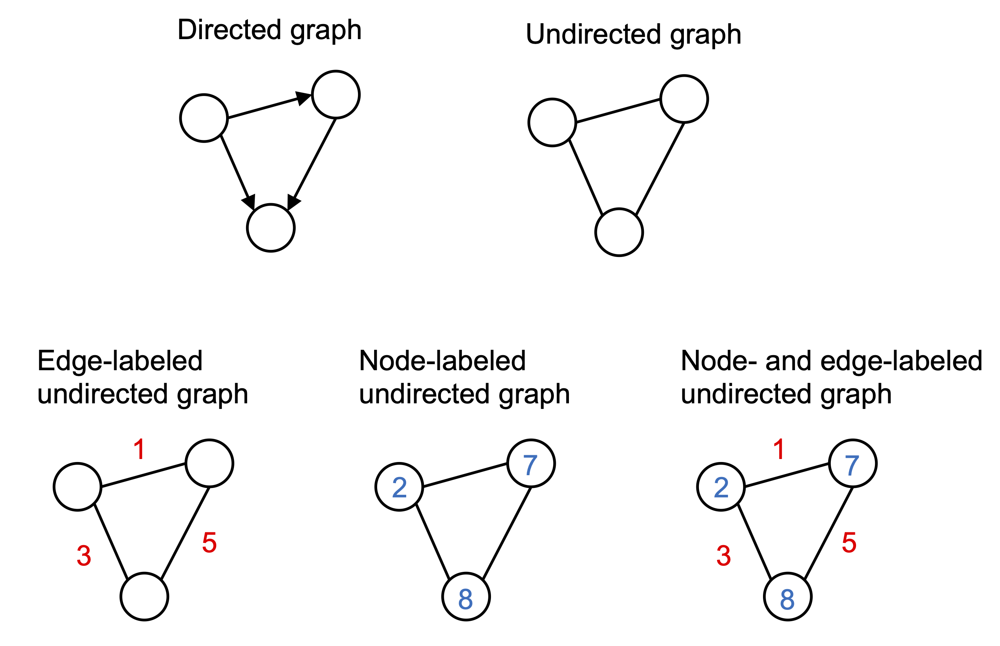

In [3]:
Image(filename='figures/18_01.png', width=500)

### Undirected graphs

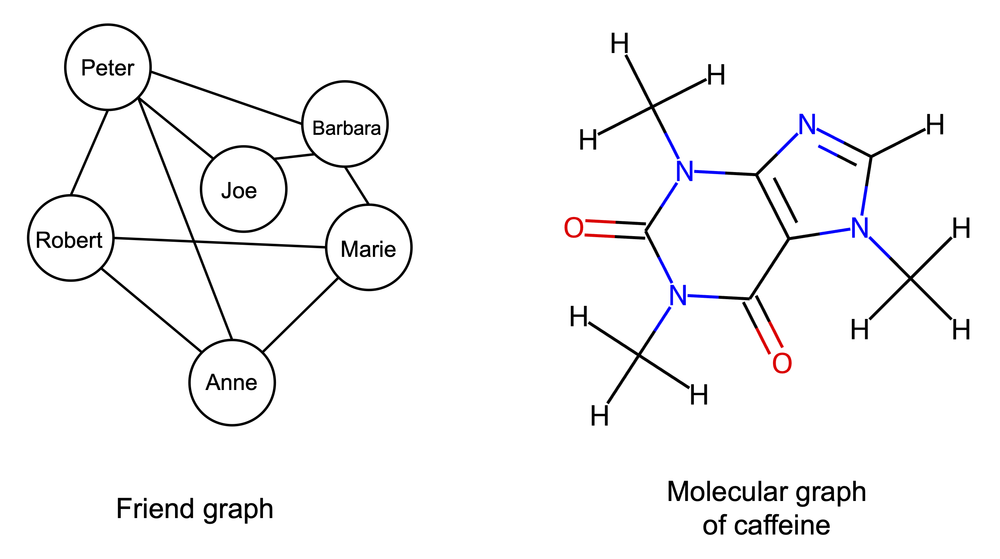

In [4]:
Image(filename='figures/18_02.png', width=500)

### Directed graphs

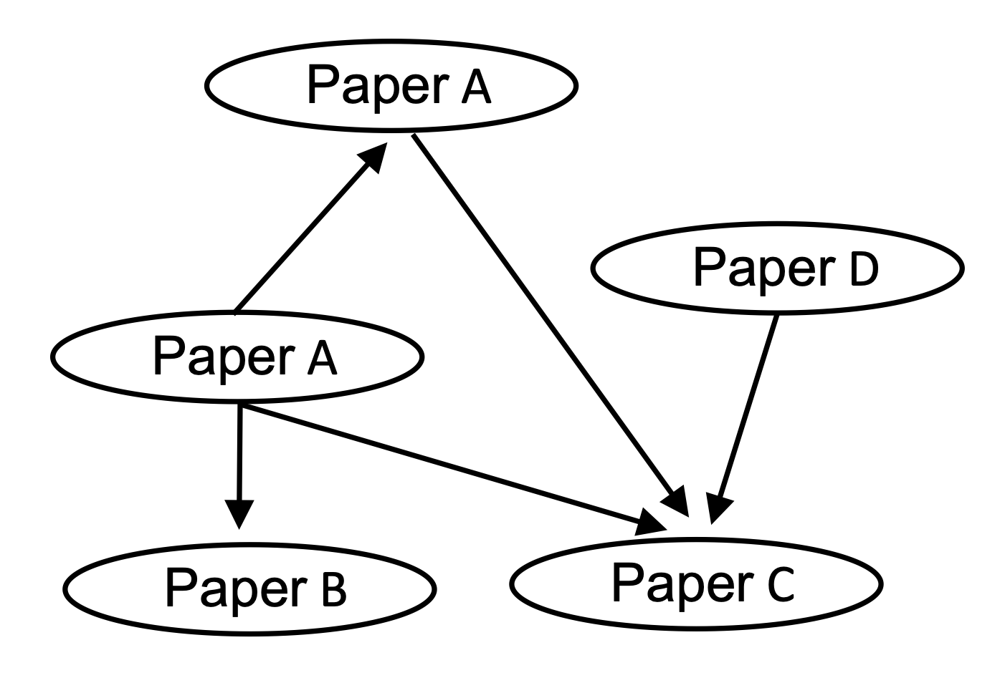

In [5]:
Image(filename='figures/18_03.png', width=300)

### Labeled graphs

### Representing molecules as graphs

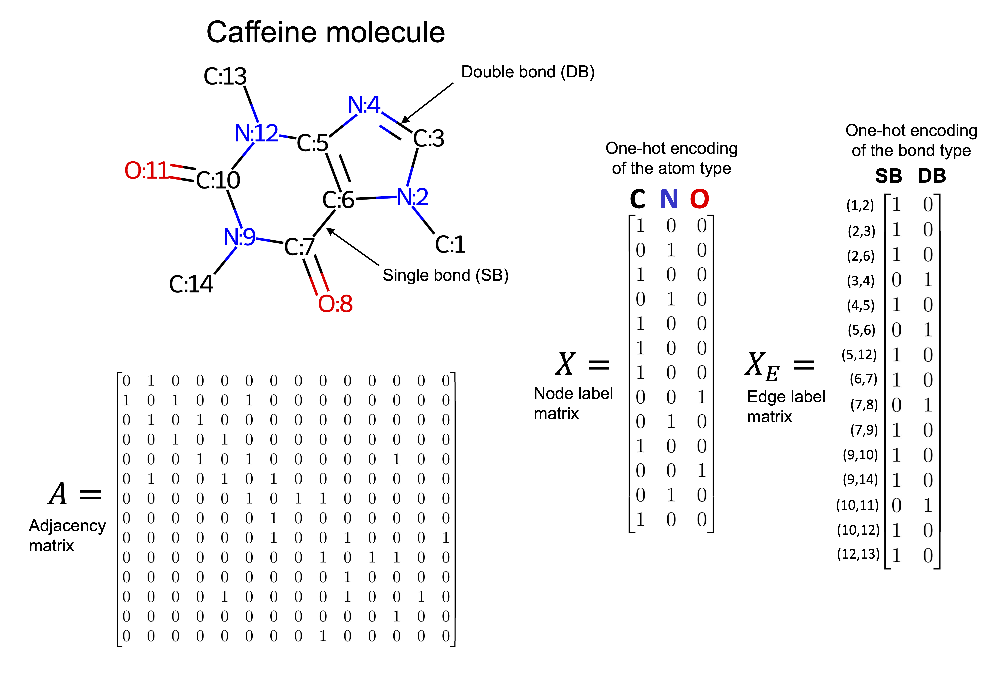

In [6]:
Image(filename='figures/18_04.png', width=500)

### Understanding graph convolutions

### The motivation behind using graph convolutions

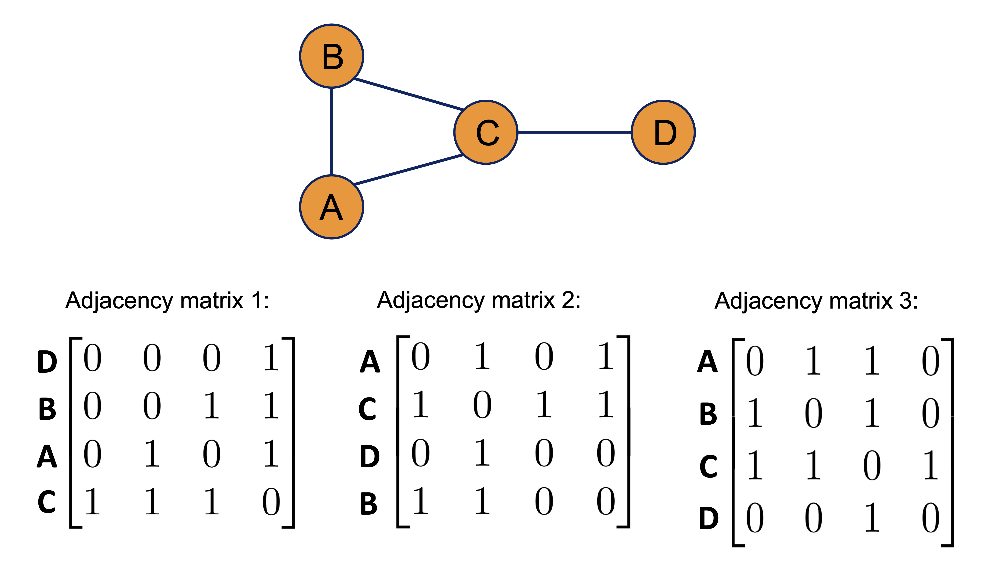

In [7]:
Image(filename='figures/18_05.png', width=500)

### Implementing a basic graph convolution

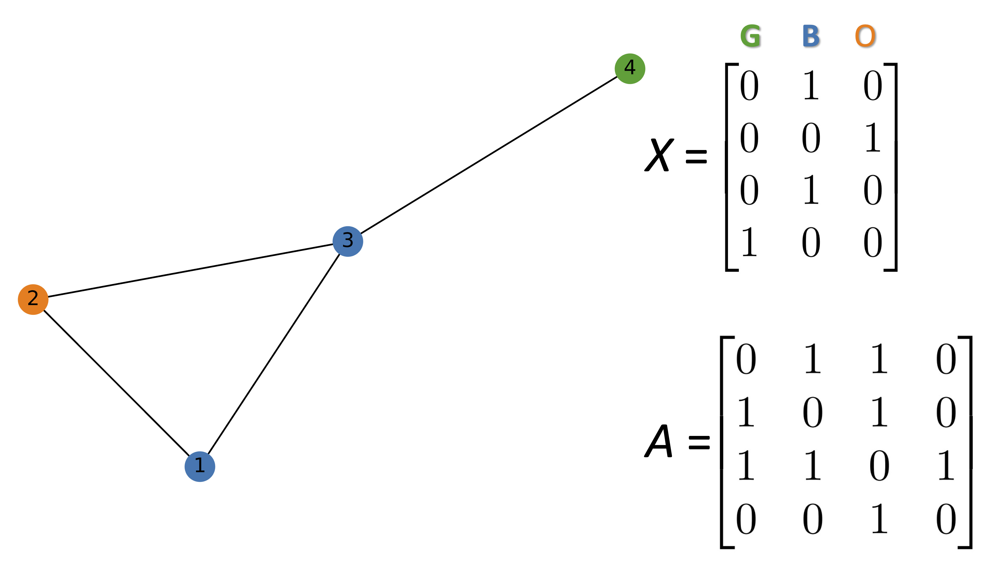

In [8]:
Image(filename='figures/18_06.png', width=500)

In [9]:
import networkx as nx
import numpy as np

In [10]:
G = nx.Graph()

#Hex codes for colors if we draw graph
blue, orange, green = "#1f77b4", "#ff7f0e","#2ca02c"

G.add_nodes_from([(1, {"color": blue}),
                  (2, {"color": orange}),
                  (3, {"color": blue}),
                  (4, {"color": green})])

G.add_edges_from([(1, 2),(2, 3),(1, 3),(3, 4)])
A = np.asarray(nx.adjacency_matrix(G).todense())
print(A)

[[0 1 1 0]
 [1 0 1 0]
 [1 1 0 1]
 [0 0 1 0]]


In [11]:
def build_graph_color_label_representation(G,mapping_dict):
    one_hot_idxs = np.array([mapping_dict[v] for v in 
                             nx.get_node_attributes(G, 'color').values()])
    one_hot_encoding = np.zeros((one_hot_idxs.size,len(mapping_dict)))
    one_hot_encoding[np.arange(one_hot_idxs.size),one_hot_idxs] = 1
    return one_hot_encoding

X = build_graph_color_label_representation(G, {green: 0, blue: 1, orange: 2})
print(X)

[[0. 1. 0.]
 [0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]


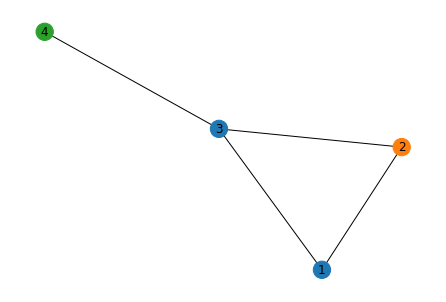

In [12]:
color_map = nx.get_node_attributes(G, 'color').values()
nx.draw(G, with_labels=True, node_color=color_map)

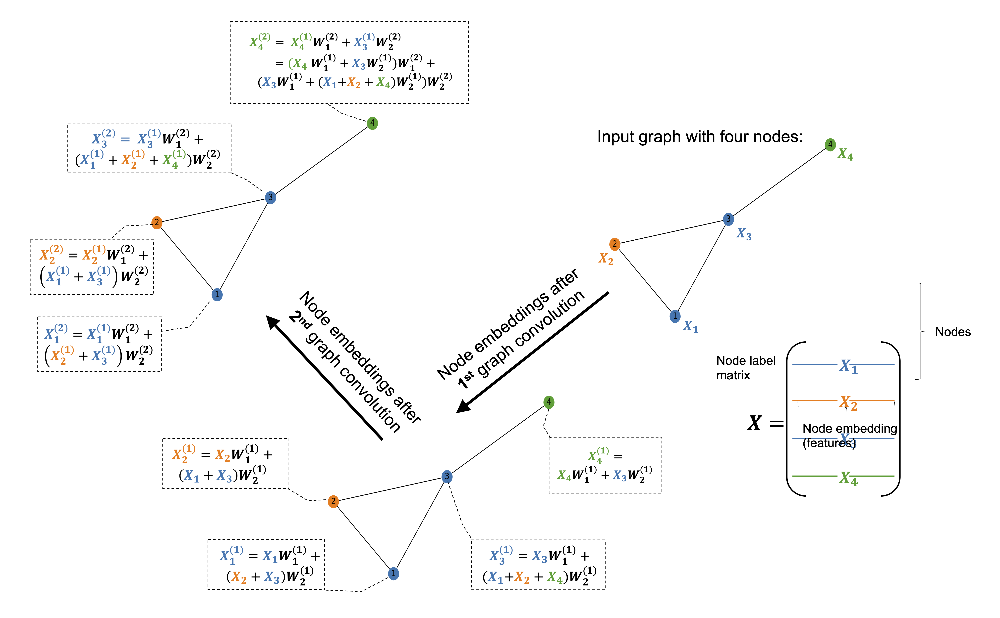

In [13]:
Image(filename='figures/18_07.png', width=800)

In [14]:
f_in, f_out = X.shape[1], 6
W_1 = np.random.rand(f_in, f_out) 
W_2 = np.random.rand(f_in, f_out) 
h = np.dot(X,W_1) + np.dot(np.dot(A, X), W_2)

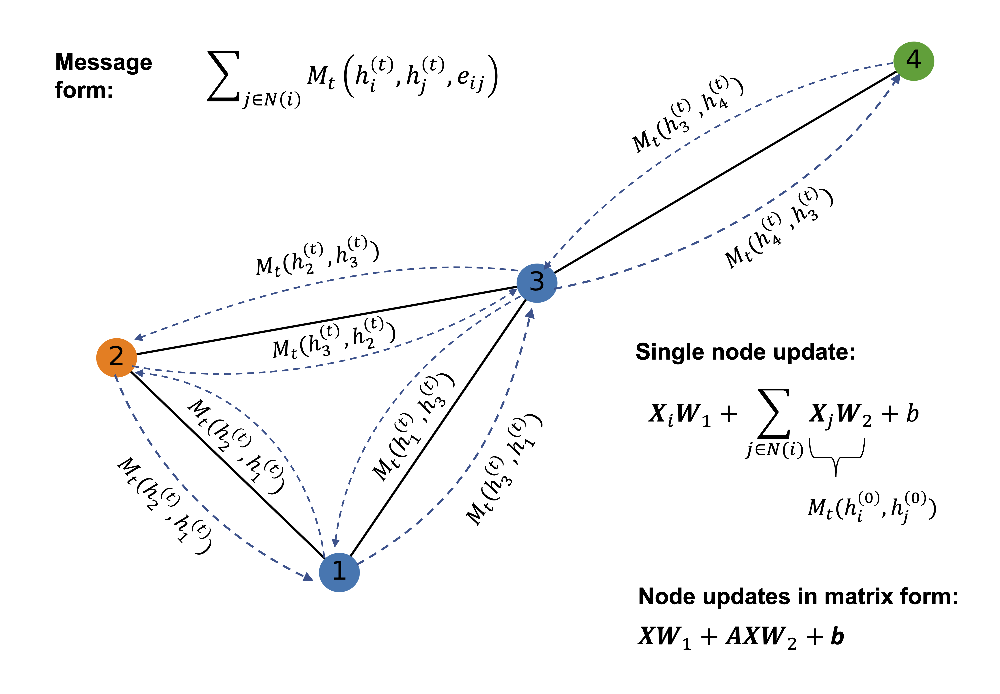

In [15]:
Image(filename='figures/18_08.png', width=500)

## Implementing a GNN in PyTorch from scratch

### Defining the NodeNetwork model

In [16]:
import networkx as nx
import torch
from torch.nn.parameter import Parameter
import numpy as np
import torch.nn.functional as F

In [17]:
class NodeNetwork(torch.nn.Module):

    def __init__(self, input_features):
        super().__init__()
        
        self.conv_1 = BasicGraphConvolutionLayer(input_features, 32)
        self.conv_2 = BasicGraphConvolutionLayer(32, 32)
        self.fc_1 = torch.nn.Linear(32, 16)
        self.out_layer = torch.nn.Linear(16, 2)
    
    def forward(self, X, A,batch_mat):
        x = self.conv_1(X, A).clamp(0)
        x = self.conv_2(x, A).clamp(0)
        output = global_sum_pool(x, batch_mat)
        output = self.fc_1(output)
        output = self.out_layer(output)
        return F.softmax(output, dim=1)

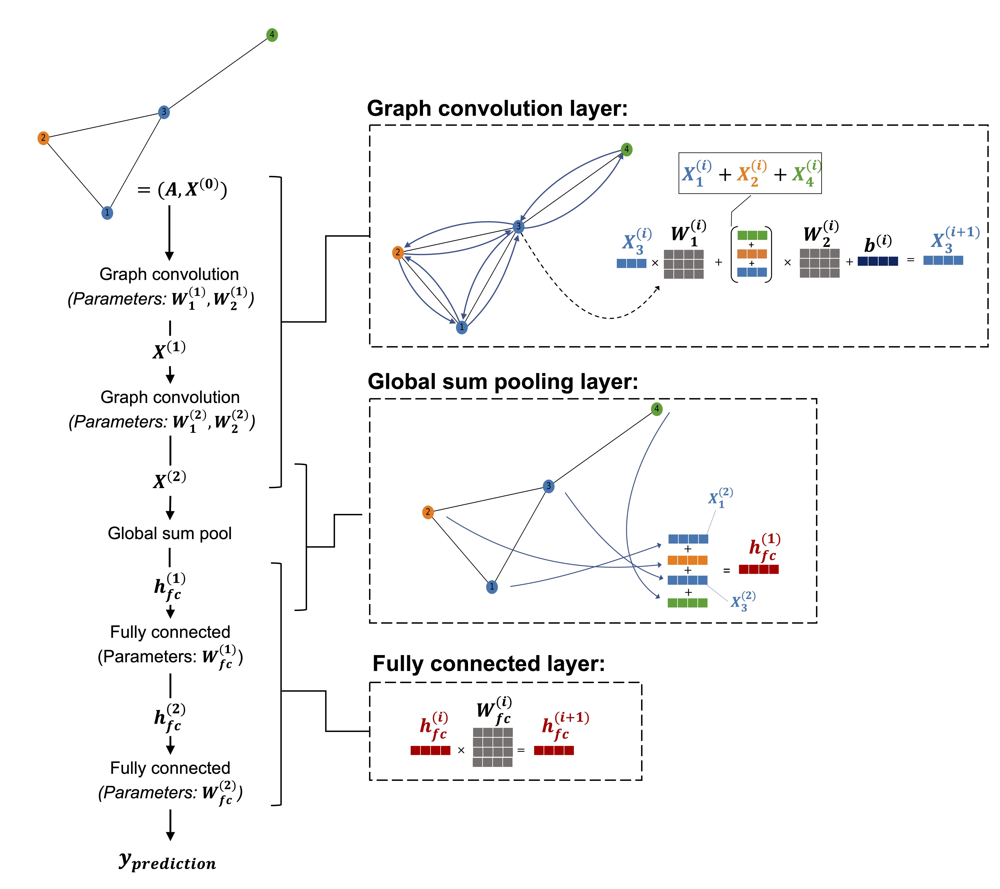

In [4]:
Image(filename='figures/18_09.png', width=700)

### Coding the NodeNetwork’s graph convolution layer

In [19]:
class BasicGraphConvolutionLayer(torch.nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        
        self.W2 = Parameter(torch.rand(
             (in_channels, out_channels), dtype=torch.float32))
        self.W1 = Parameter(torch.rand(
             (in_channels, out_channels), dtype=torch.float32))
         
        self.bias = Parameter(torch.zeros(
                 out_channels, dtype=torch.float32))
    
    def forward(self, X, A):
        potential_msgs = torch.mm(X, self.W2)
        propagated_msgs = torch.mm(A, potential_msgs)
        root_update = torch.mm(X, self.W1)
        output = propagated_msgs + root_update + self.bias
        return output

### Adding a global pooling layer to deal with varying graph sizes

In [20]:
def global_sum_pool(X, batch_mat):
    if batch_mat is None or batch_mat.dim() == 1:
        return torch.sum(X, dim=0).unsqueeze(0)
    else:
        return torch.mm(batch_mat, X)

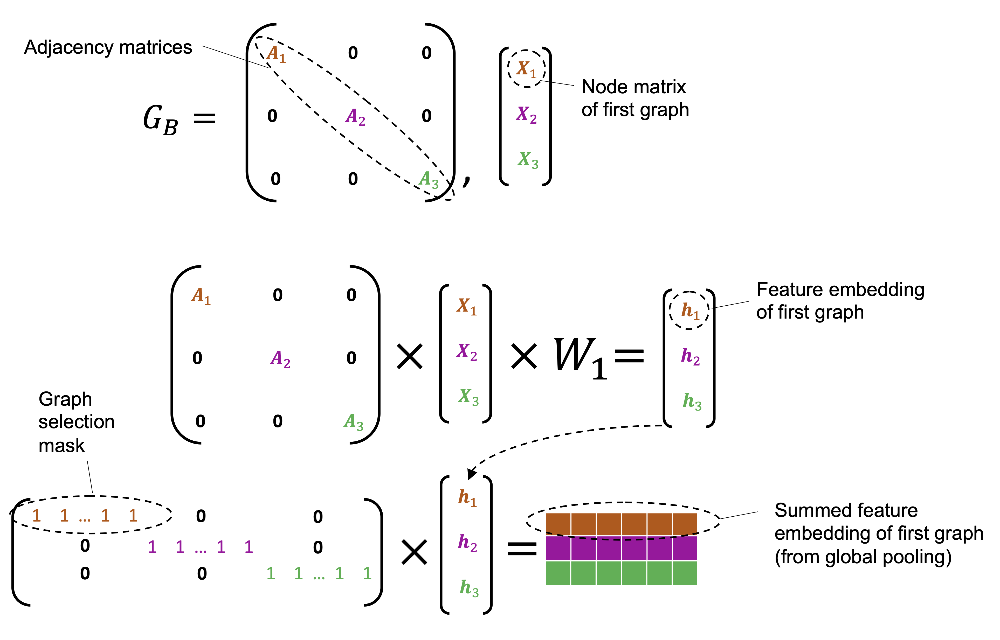

In [21]:
Image(filename='figures/18_10.png', width=600)

In [22]:
def get_batch_tensor(graph_sizes):
    starts = [sum(graph_sizes[:idx]) for idx in range(len(graph_sizes))]
    stops = [starts[idx]+graph_sizes[idx] for idx in range(len(graph_sizes))]
    tot_len = sum(graph_sizes)
    batch_size = len(graph_sizes)
    batch_mat = torch.zeros([batch_size, tot_len]).float()
    for idx, starts_and_stops in enumerate(zip(starts, stops)):
        start = starts_and_stops[0]
        stop = starts_and_stops[1]
        batch_mat[idx, start:stop] = 1
    return batch_mat

In [23]:
def collate_graphs(batch):
    adj_mats = [graph['A'] for graph in batch]
    sizes = [A.size(0) for A in adj_mats]
    tot_size = sum(sizes)
    # create batch matrix
    batch_mat = get_batch_tensor(sizes)
    # combine feature matrices
    feat_mats = torch.cat([graph['X'] for graph in batch],dim=0)
    # combine labels
    labels = torch.cat([graph['y'] for graph in batch], dim=0)
    # combine adjacency matrices
    batch_adj = torch.zeros([tot_size, tot_size], dtype=torch.float32)
    accum = 0
    for adj in adj_mats:
        g_size = adj.shape[0]
        batch_adj[accum:accum+g_size, accum:accum+g_size] = adj
        accum = accum + g_size
    repr_and_label = {
            'A': batch_adj, 
            'X': feat_mats,
            'y': labels,
            'batch' : batch_mat}

    return repr_and_label

### Preparing the DataLoader

In [24]:
def get_graph_dict(G, mapping_dict):
    # build dictionary representation of graph G
    A = torch.from_numpy(np.asarray(nx.adjacency_matrix(G).todense())).float()
    # build_graph_color_label_representation() was introduced with the first example graph
    X = torch.from_numpy(build_graph_color_label_representation(G,mapping_dict)).float()
    # kludge since there is not specific task for this example
    y = torch.tensor([[1, 0]]).float()
    return {'A': A, 'X': X, 'y': y, 'batch': None}
    
# building 4 graphs to treat as a dataset

blue, orange, green = "#1f77b4", "#ff7f0e","#2ca02c"
mapping_dict = {green: 0, blue: 1, orange: 2}

G1 = nx.Graph()
G1.add_nodes_from([(1, {"color": blue}),
                   (2, {"color": orange}),
                   (3, {"color": blue}),
                   (4, {"color": green})])
G1.add_edges_from([(1, 2), (2, 3),(1, 3), (3, 4)])
G2 = nx.Graph()
G2.add_nodes_from([(1, {"color": green}),
                   (2, {"color": green}),
                   (3, {"color": orange}),
                   (4, {"color": orange}),
                   (5,{"color": blue})])
G2.add_edges_from([(2, 3),(3, 4),(3, 1),(5, 1)])
G3 = nx.Graph()
G3.add_nodes_from([(1, {"color": orange}),
                   (2, {"color": orange}),
                   (3, {"color": green}),
                   (4, {"color": green}),
                   (5, {"color": blue}),
                   (6, {"color":orange})])
G3.add_edges_from([(2, 3), (3, 4), (3, 1), (5, 1), (2, 5), (6, 1)])
G4 = nx.Graph()
G4.add_nodes_from([(1, {"color": blue}), (2, {"color": blue}), (3, {"color": green})])
G4.add_edges_from([(1, 2), (2, 3)])
graph_list = [get_graph_dict(graph,mapping_dict) for graph in [G1, G2, G3, G4]]

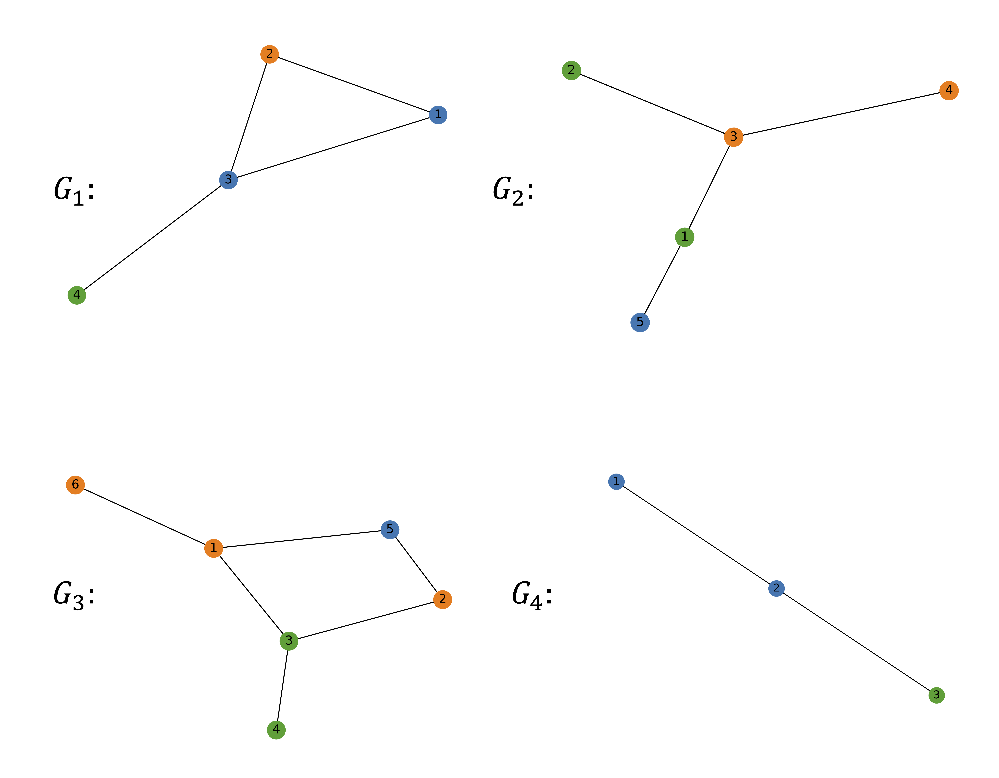

In [25]:
Image(filename='figures/18_11.png', width=600)

In [26]:
from torch.utils.data import Dataset
from torch.utils.data import DataLoader


class ExampleDataset(Dataset):
    
    # Simple PyTorch dataset that will use our list of graphs
    def __init__(self, graph_list):
        self.graphs = graph_list
        
    def __len__(self):
        return len(self.graphs)
    
    def __getitem__(self,idx):
        mol_rep = self.graphs[idx]
        return mol_rep

In [27]:
dset = ExampleDataset(graph_list)
# Note how we use our custom collate function
loader = DataLoader(dset, batch_size=2, shuffle=False, collate_fn=collate_graphs)

### Using the NodeNetwork to make predictions

In [28]:
torch.manual_seed(123)
node_features = 3
net = NodeNetwork(node_features)

In [29]:
batch_results = []

for b in loader:
    batch_results.append(net(b['X'], b['A'], b['batch']).detach())

G1_rep = dset[1]
G1_single = net(G1_rep['X'], G1_rep['A'], G1_rep['batch']).detach()

G1_batch = batch_results[0][1]
torch.all(torch.isclose(G1_single, G1_batch))

tensor(True)

---

Readers may ignore the next cell.

In [3]:
! python ../.convert_notebook_to_script.py --input ch18_part1.ipynb --output ch18_part1.py

python: can't open file '../.convert_notebook_to_script.py': [Errno 2] No such file or directory
